# Setup

In [1]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [2]:
import scanpy as sc
import seaborn as sns
import scrnatools as rna
import matplotlib.pyplot as plt
import scipy
import numpy as np
import pandas as pd
import math
from scipy.stats import ttest_ind
from scipy.stats import gaussian_kde
import anndata as ad

In [3]:
# Setup figure params
plt.rcParams["pdf.use14corefonts"] = True
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = "Arial"
sc.set_figure_params(dpi=80, dpi_save=600, facecolor="white", frameon=False)
sns.set_context("paper")
plt.rcParams["axes.grid"] = False
cmap = sns.color_palette("colorblind")
# Get the tab20 colormap
tab20_cmap = plt.get_cmap('tab20')

# Create a new colormap without the 7th and 8th colors
colors_to_exclude = [6, 7]  # 0-based index, so 6 and 7 represent the 7th and 8th colors
new_tab20 = [tab20_cmap(i) for i in range(tab20_cmap.N) if i not in colors_to_exclude]

In [4]:
warnings.resetwarnings()

# Data paths

In [5]:
rawDataPath = "/mnt/iacchus/joe/raw_data/"
processedDataPath = "/mnt/iacchus/joe/processed_data/"

In [6]:
# rawDataPath = "/mnt/e/Archive/Joe/raw_data/"
# processedDataPath = "/mnt/e/Archive/Joe/processed_data/"

# Import data

In [7]:
filteredAdata = sc.read(f"{processedDataPath}/Fezf2_thymus_paper/h5ad_files/combined_all_genes_TECs_final.h5ad")

# Genotype/cell type plots

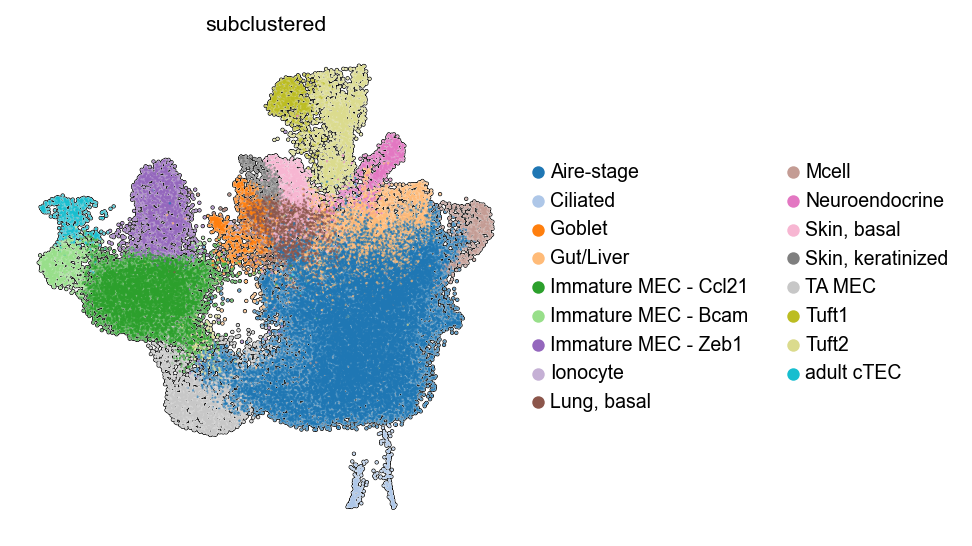

In [9]:
sc.settings.figdir = "../../analysis/feature_plots"
sc.pl.umap(
    filteredAdata,
    add_outline=True,
    color=["subclustered"],
    save="_cell_types.pdf",
    palette=new_tab20,
    s=5
)

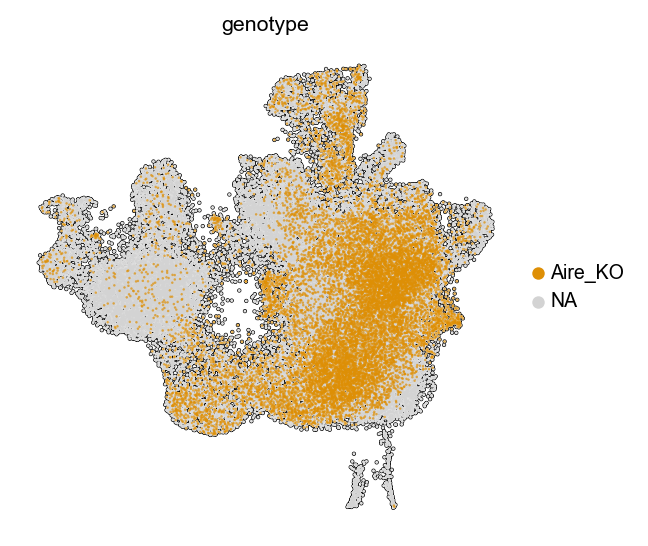

In [10]:
sc.settings.figdir = "../../analysis/feature_plots"
sc.pl.umap(
    filteredAdata,
    add_outline=True,
    color=["genotype"],
    groups=["Aire_KO"],
    save="_Aire_KO.pdf",
    palette=[cmap[1]],
    s=5
)

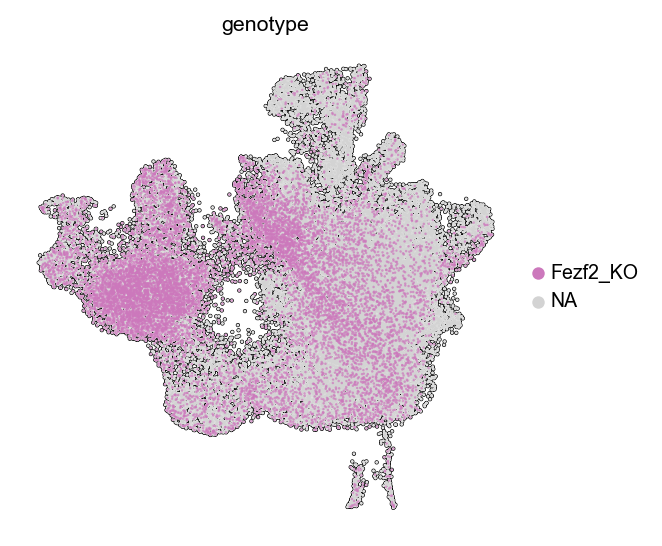

In [11]:
sc.settings.figdir = "../../analysis/feature_plots"
sc.pl.umap(
    filteredAdata,
    add_outline=True,
    color=["genotype"],
    groups=["Fezf2_KO"],
    save="_Fezf2_KO.pdf",
    palette=[cmap[4]],
    s=5
)

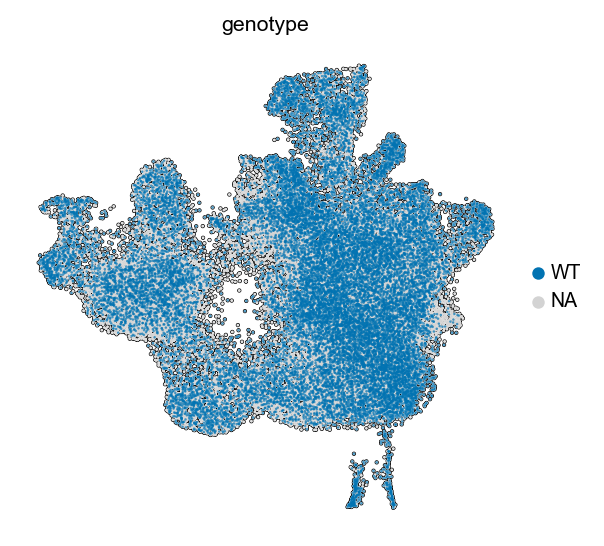

In [12]:
sc.settings.figdir = "../../analysis/feature_plots"
sc.pl.umap(
    filteredAdata,
    add_outline=True,
    color=["genotype"],
    groups=["WT"],
    save="_WT.pdf",
    palette=[cmap[0]],
    s=5
)

# Feature plots

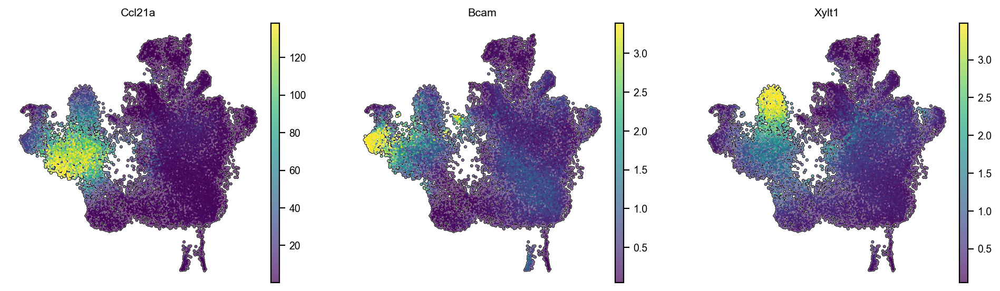

In [13]:
gene_list = ["Ccl21a", "Bcam", "Xylt1"]
sc.settings.figdir = "../../analysis/feature_plots"
exprs = rna.tl.get_expression_matrix(
    filteredAdata[filteredAdata.obs.genotype == "WT"],
    gene_data="scVI_normalized"
)
vmin = []
vmax = []
for gene in gene_list:
    vmin.append(np.quantile(exprs[gene], 0.01))
    vmax.append(np.quantile(exprs[gene], 0.99))
    
sc.pl.umap(
    filteredAdata[filteredAdata.obs.genotype == "WT"],
    color=gene_list,
    layer="scVI_normalized",
    vmin=vmin,
    vmax=vmax,
    s=10,
    ncols=7,
    add_outline=True,
    save="_WT_immature_MEC_features.pdf"
)

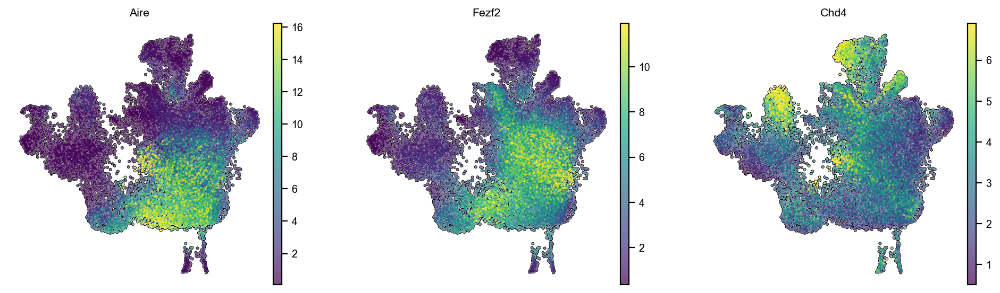

In [14]:
sc.settings.figdir = "../../analysis/feature_plots"
rna.pl.gene_embedding(
    filteredAdata[filteredAdata.obs.genotype == "WT"],
    gene_list=["Aire", "Fezf2", "Chd4"],
    layer="scVI_normalized",
    cmap="viridis",
    ncols=3,
    s=10,
    add_outline=True,
    save="_WT_TF_expression.pdf"
)

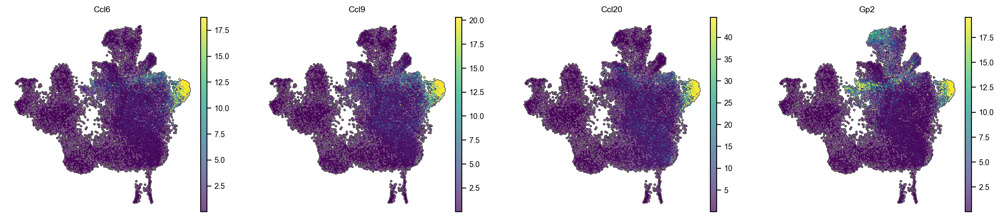

In [15]:
sc.settings.figdir = "../../analysis/feature_plots"
rna.pl.gene_embedding(
    filteredAdata[filteredAdata.obs.genotype == "WT"],
    gene_list=["Ccl6", "Ccl9", "Ccl20", "Gp2"],
    layer="scVI_normalized",
    cmap="viridis",
    ncols=4,
    add_outline=True,
    s=10,
    save="_WT_M_cell_chemokines.pdf"
)

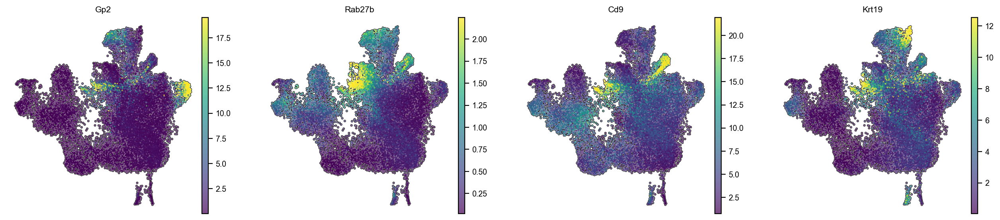

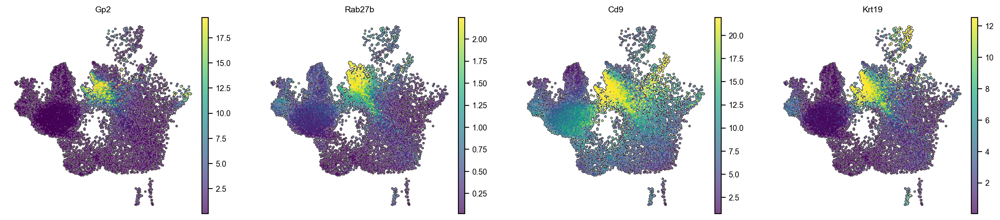

In [16]:
gene_list = ["Gp2", "Rab27b", "Cd9", "Krt19"]
sc.settings.figdir = "../../analysis/feature_plots"
exprs = rna.tl.get_expression_matrix(
    filteredAdata[filteredAdata.obs.genotype == "WT"],
    gene_data="scVI_normalized"
)
vmin = []
vmax = []
for gene in gene_list:
    vmin.append(np.quantile(exprs[gene], 0.01))
    vmax.append(np.quantile(exprs[gene], 0.99))
    
sc.pl.umap(
    filteredAdata[filteredAdata.obs.genotype == "WT"],
    color=gene_list,
    layer="scVI_normalized",
    vmin=vmin,
    vmax=vmax,
    s=10,
    add_outline=True,
    save="_WT_gp2+_non_M_feature_plots.pdf"
)
sc.pl.umap(
    filteredAdata[filteredAdata.obs.genotype == "Fezf2_KO"],
    layer="scVI_normalized",
    color=gene_list,
    vmin=vmin,
    vmax=vmax,
    s=10,
    add_outline=True,
    save="_Fezf2_KO_gp2+_non_M_feature_plots.pdf"
)

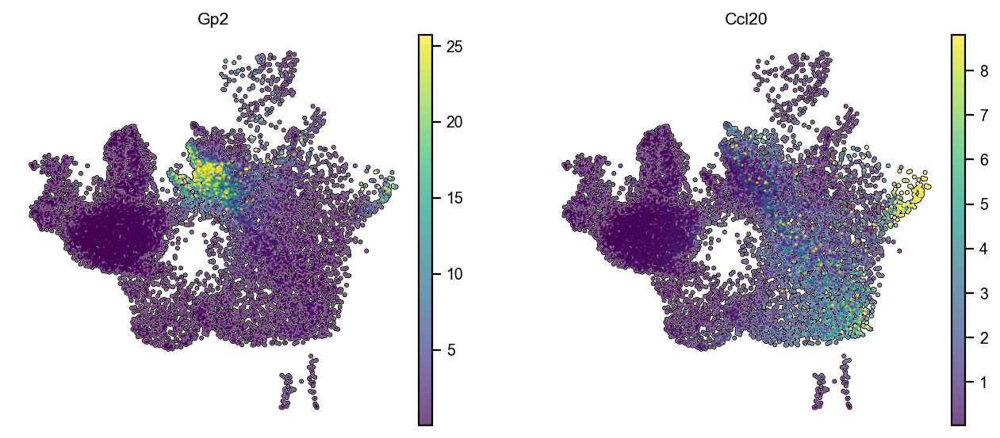

In [17]:
gene_list = ["Gp2", "Ccl20"]
sc.settings.figdir = "../../analysis/feature_plots"
exprs = rna.tl.get_expression_matrix(
    filteredAdata[filteredAdata.obs.genotype == "Fezf2_KO"],
    gene_data="scVI_normalized"
)
vmin = []
vmax = []
for gene in gene_list:
    vmin.append(np.quantile(exprs[gene], 0.01))
    vmax.append(np.quantile(exprs[gene], 0.99))

sc.pl.umap(
    filteredAdata[filteredAdata.obs.genotype == "Fezf2_KO"],
    color=gene_list,
    layer="scVI_normalized",
    s=10,
    ncols=2,
    vmin=vmin,
    vmax=vmax,
    add_outline=True,
    save="_Fezf2_KO_Ccl12_Gp2.pdf"
)

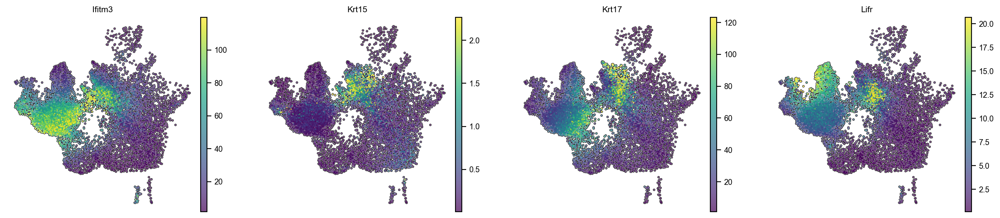

In [18]:
gene_list = ["Ifitm3", "Krt15", "Krt17", "Lifr"]
sc.settings.figdir = "../../analysis/feature_plots"
exprs = rna.tl.get_expression_matrix(
    filteredAdata[filteredAdata.obs.genotype == "Fezf2_KO"],
    gene_data="scVI_normalized"
)
vmin = []
vmax = []
for gene in gene_list:
    vmin.append(np.quantile(exprs[gene], 0.01))
    vmax.append(np.quantile(exprs[gene], 0.99))

sc.pl.umap(
    filteredAdata[filteredAdata.obs.genotype == "Fezf2_KO"],
    color=gene_list,
    layer="scVI_normalized",
    s=10,
    ncols=5,
    vmin=vmin,
    vmax=vmax,
    add_outline=True,
    save="_Fezf2_KO_keratins.pdf"
)

# Aire/Fezf2 expression

In [155]:
exprs = filteredAdata[filteredAdata.obs.genotype == "WT", "Fezf2"].layers["scVI_normalized"]

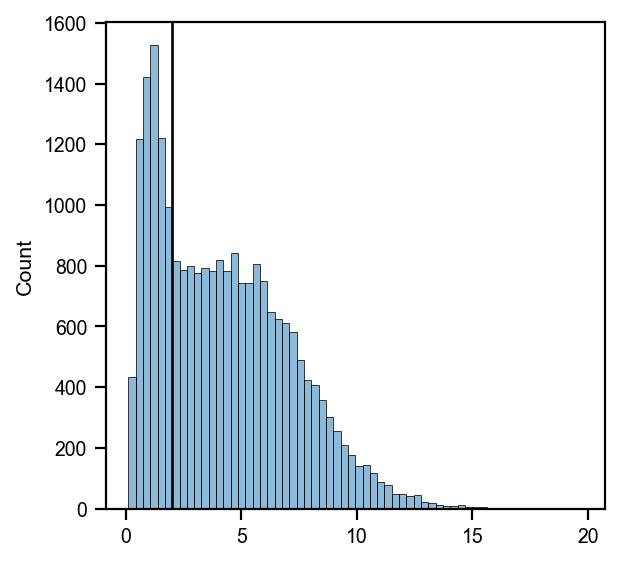

In [156]:
sns.histplot(exprs, legend=False)
plt.axvline(x=2, c="black")
plt.show()

In [157]:
wt_data = filteredAdata[filteredAdata.obs.genotype == "WT"].copy()
wt_data.obs["Fezf2_expressed"] = exprs > 2

In [158]:
exprs = filteredAdata[filteredAdata.obs.genotype == "WT", "Aire"].layers["scVI_normalized"]

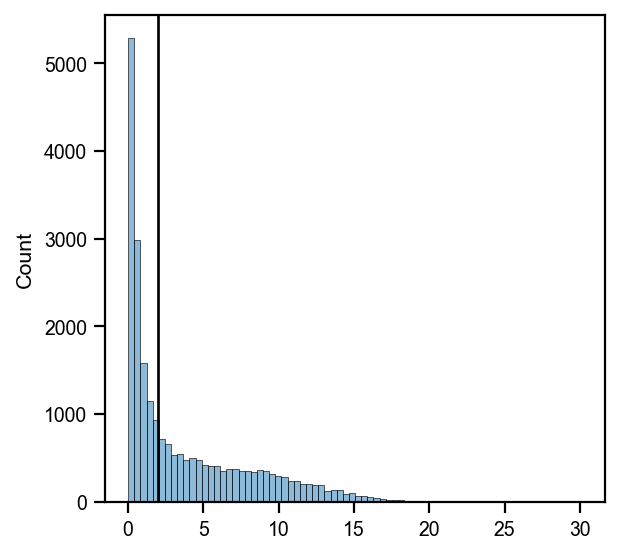

In [159]:
sns.histplot(exprs, legend=False)
plt.axvline(x=2, c="black")
plt.show()

In [160]:
wt_data.obs["Aire_expressed"] = exprs > 2

In [161]:
wt_data.obs["Aire_Fezf2_expressed"] = 'none'

# Assign labels based on conditions
wt_data.obs.loc[wt_data.obs['Aire_expressed'] & ~wt_data.obs['Fezf2_expressed'], 'Aire_Fezf2_expressed'] = 'Aire_only'
wt_data.obs.loc[~wt_data.obs['Aire_expressed'] & wt_data.obs['Fezf2_expressed'], 'Aire_Fezf2_expressed'] = 'Fezf2_only'
wt_data.obs.loc[wt_data.obs['Aire_expressed'] & wt_data.obs['Fezf2_expressed'], 'Aire_Fezf2_expressed'] = 'both'

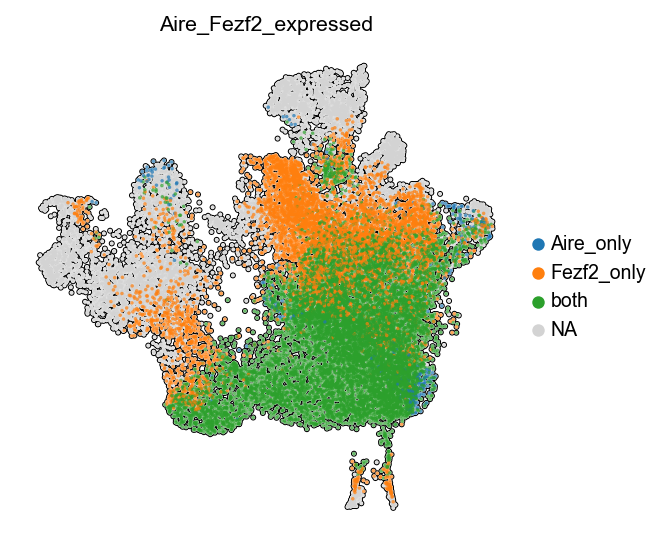

In [163]:
sc.settings.figdir = "../../analysis/feature_plots"

sc.pl.umap(
    wt_data,
    color="Aire_Fezf2_expressed",
    s=10,
    add_outline=True,
    groups=["Aire_only", "Fezf2_only", "both"],
    palette=["tab:blue", "tab:orange", "tab:green"],
    save="_Aire_Fezf2_expressed_cells.pdf"
)